## Introduction

The purpose of this notebook is to analyze the different mask generating methods. Such as HSV colorspace manipulation and semantic segantation.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import os
import urllib
import requests
import PIL
import skimage
import cv2
import colorsys
from PIL import Image
from io import BytesIO
from scipy import stats  
from skimage.color import rgb2hsv
from google.colab.patches import cv2_imshow

In [ ]:
!pip install imutils
import imutils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%%bash
# Colab-specific setup
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit 
pip install yacs 2>&1 >> install.log
git init 2>&1 >> install.log
git remote add origin https://github.com/CSAILVision/semantic-segmentation-pytorch.git 2>> install.log
git pull origin master 2>&1 >> install.log
DOWNLOAD_ONLY=1 ./demo_test.sh 2>> install.log

From https://github.com/CSAILVision/semantic-segmentation-pytorch
 * branch            master     -> FETCH_HEAD
 * [new branch]      master     -> origin/master


In [ ]:
# System libs
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
# Our libs
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode

colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]

def visualize_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')
        
    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    im_vis = numpy.concatenate((img, pred_color), axis=1)
    display(PIL.Image.fromarray(im_vis))

In [ ]:
# Network Builders
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/encoder_epoch_20.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/decoder_epoch_20.pth',
    use_softmax=True)

crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()
segmentation_module.cuda()

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

In [ ]:
def get_mask(prediction):
  # get colored version of prediction
  pred_color = colorEncode(prediction, colors).astype(numpy.uint8)

  #convert color prediction into NumPy array for cv2 functions
  image_cv2 = np.array(pred_color)

  # find all pixels that match the value of sky color endcoding
  sky_pixel = np.array([6, 230, 230])
  isolate_sky = cv2.inRange(image_cv2, sky_pixel, sky_pixel)
  mask = cv2.bitwise_and(image_cv2, image_cv2, mask=isolate_sky)

  # convert to binary mask with white being obstructions and black being sky
  black_pixels_mask = np.all(mask == [0, 0, 0], axis=-1)
  non_black_pixels_mask = np.any(mask != [0, 0, 0], axis=-1)
  mask[black_pixels_mask] = [255, 255, 255]
  mask[non_black_pixels_mask] = [0, 0, 0]

  # apply dilation to mask
  kernel = np.ones((2,2),np.uint8) 
  dilated_mask = cv2.dilate(mask,kernel,iterations = 8) 

  # only need one of the layers in binary mask
  return mask[:,:,0], dilated_mask[:,:,0]

In [ ]:
def semantic_seg(img):
  pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
  pil_image = Image.fromarray(img)
  img_original = numpy.array(pil_image)
  img_data = pil_to_tensor(pil_image)
  singleton_batch = {'img_data': img_data[None].cuda()}
  output_size = img_data.shape[1:]


  with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)
    
# Get the predicted scores for each pixel
  _, pred = torch.max(scores, dim=1)
  pred = pred.cpu()[0].numpy()

  mask, dilated_mask = get_mask(pred)

  return mask

In [ ]:
images = []
ratios = []

directory = r'/content/drive/Shareddrives/FIRE-CC/Peer Mentors/2022/Anthony/_FALL2022/Images/'
for filename in os.listdir(directory):
  image = cv2.imread(os.path.join(directory, filename),-1)
  image_rs = imutils.resize(image, height=450)

  hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
  hsv_rs = imutils.resize(hsv, height=450)

  blur1 = cv2.GaussianBlur(hsv[:,:,0],(5,5),0)
  ret1,mask1 = cv2.threshold(blur1,127,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
  mask1_rs = imutils.resize(mask1, height=450) 

  number_of_white_pix1 = np.sum(mask1 == 255)
  number_of_black_pix1 = np.sum(mask1 == 0)

  blur2 = cv2.GaussianBlur(hsv[:,:,2],(5,5),0)
  ret2,mask2 = cv2.threshold(blur2,127,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
  mask2_rs = imutils.resize(mask2, height=450)

  number_of_white_pix2 = np.sum(mask2 == 255)
  number_of_black_pix2 = np.sum(mask2 == 0)

  rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  rgb_rs = imutils.resize(rgb, height=450)
  mask3 = semantic_seg(rgb_rs)

  number_of_white_pix3 = np.sum(mask3 == 255)
  number_of_black_pix3 = np.sum(mask3 == 0)

  # hori1 = np.concatenate((hsv_rs[:,:,0], mask1_rs), axis=1)
  # hori2 = np.concatenate((hsv_rs[:,:,2], mask2_rs), axis=1)
  hori3 = np.concatenate((mask1_rs, mask2_rs), axis=1)
  hori = np.concatenate((hori3, mask3), axis=1)
  hori_3d = ((np.stack([hori, hori, hori], axis=2))) 

  ratios.append((number_of_white_pix1/(number_of_white_pix1+number_of_black_pix1),number_of_white_pix2/(number_of_white_pix2+number_of_black_pix2),number_of_white_pix3/(number_of_white_pix3+number_of_black_pix3)))

  fin = np.concatenate((image_rs,hori_3d), axis=1)
  images.append(fin)

1
(0.12953028549382717, 0.361899112654321, 0.09150555555555556)


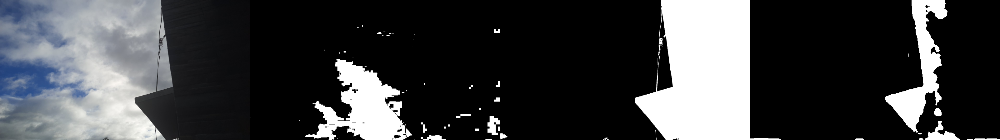

2
(0.4651609052185689, 0.5536924839380196, 0.5128703703703704)


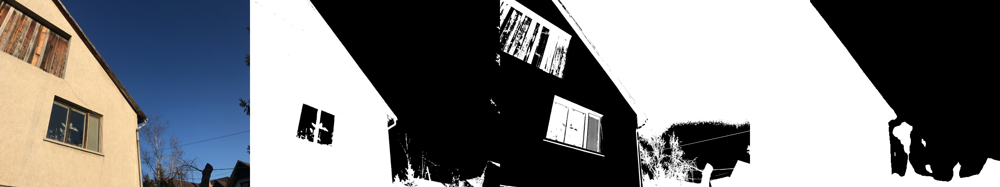

3
(0.2531192555147059, 0.4974575865502451, 0.2498992443324937)


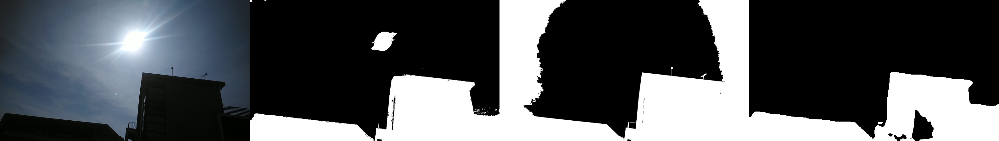

4
(0.2287841448307718, 0.452831547356597, 0.5878851851851852)


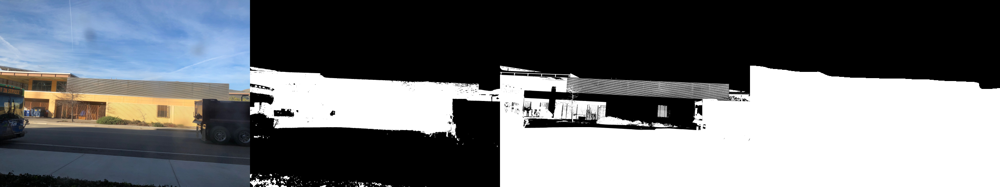

5
(0.13519803113553114, 0.6635714285714286, 0.06945322561760918)


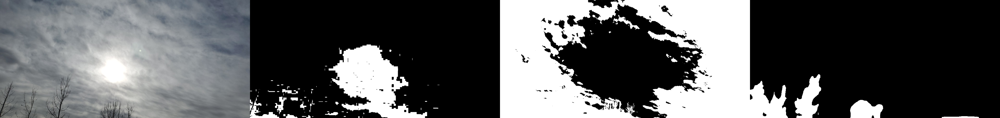

6
(0.04378923637356177, 0.73682481287268, 0.09157037037037037)


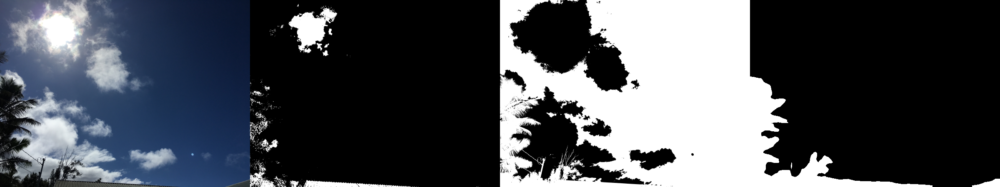

7
(0.5461062885802469, 0.2832209683641975, 0.004722222222222222)


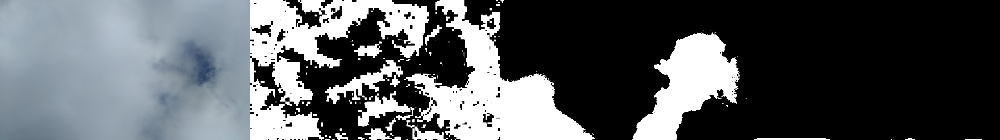

8
(0.3695023148148148, 0.4840798611111111, 0.005302777777777778)


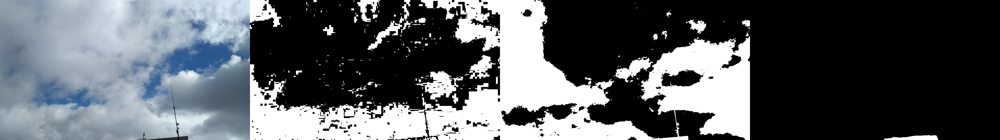

9
(0.002184281085800333, 0.5967214883298091, 0.02852962962962963)


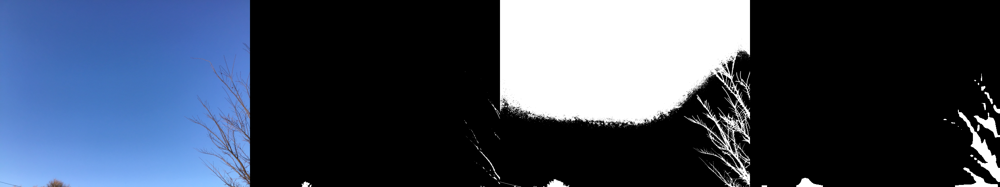

10
(0.17855420524691357, 0.6538284005731922, 0.006303703703703704)


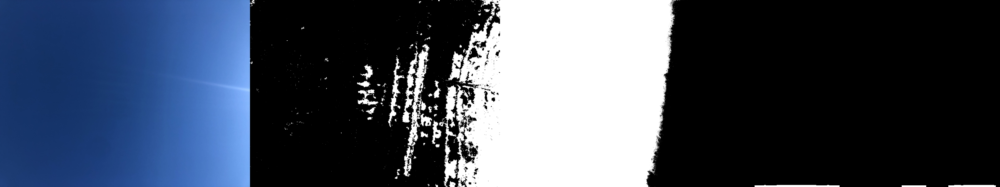

11
(0.00916280864197531, 0.8954343785072951, 0.025057216685123663)


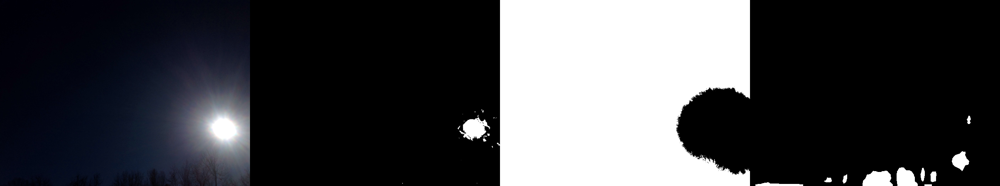

12
(0.00034282617367934826, 0.5314525791026287, 0.0017444444444444445)


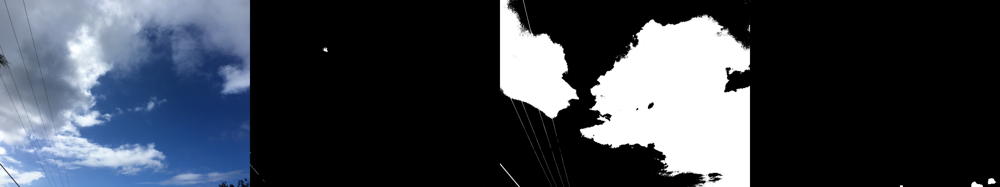

13
(0.4991743739676941, 0.14969048318916045, 0.1799638888888889)


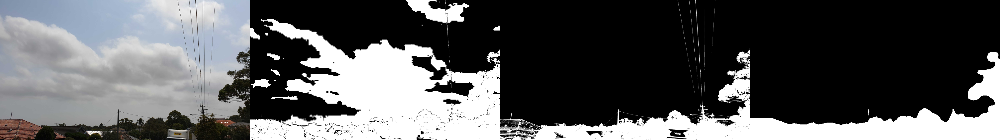

14
(0.029123083454060637, 0.3294197839243722, 0.04633703703703704)


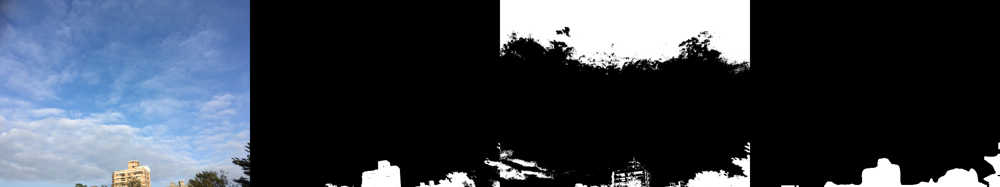

15
(0.11394590629461661, 0.230734481292517, 0.32333703703703703)


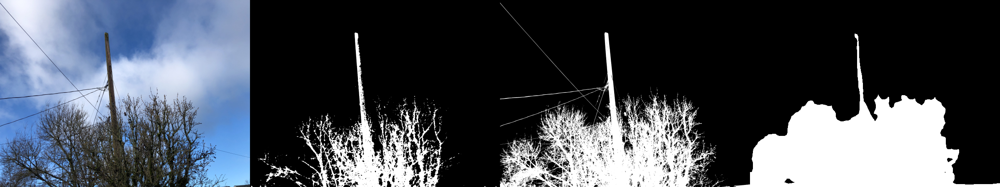

16
(0.10017216435185185, 0.18721836419753085, 0.19120833333333334)


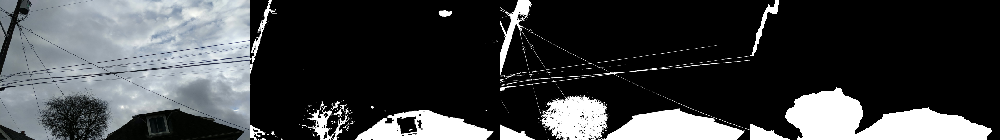

17
(0.12335623871462165, 0.7836066428886369, 0.014981481481481481)


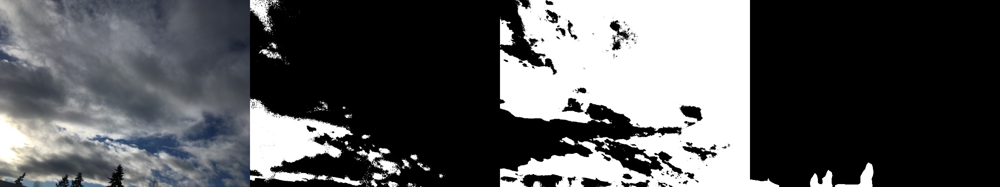

18
(0.05956530953430755, 0.2899921494446544, 0.33983703703703705)


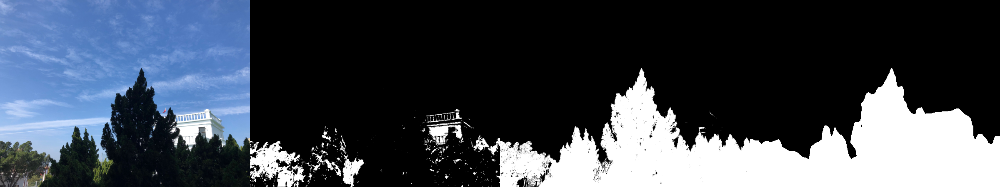

In [ ]:
for i in range(0,len(images)):
  print(i+1)
  print(ratios[i])
  cv2_imshow(images[i])